In [1]:
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
%matplotlib inline
import pyodbc
con = pyodbc.connect('DSN=ISDW')
from sklearn.model_selection import train_test_split
from sklearn import model_selection
from sklearn import ensemble
from sklearn import metrics

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [2]:
data = pd.read_csv('~/Documents/DMIW_Python/data/Donut_SCF_Training.csv')

In [3]:
data.shape

(2911, 3)

# Apply Machine Learning to Classify Wafers as Donut SCF

## Get SCF Count per Wafer

In [3]:
daysback = 300

SQLQuery1 = """
select tw.lot_id, substr(tw.lot_id,1,9) as lot_id_base, tw.wafer_id, tw.family_code, 
corner || ' ' || prc.categoryName as parameter, count,
tc.normalized_TestX as chipX, tc.normalized_TestY as chipY,
case 
    when corner = 'M7125P125AA' and prc.categoryName = 'SCF' then count
    else 0
end as SCF_COUNT
from
    DMIW.PattRecChipFactR prcfr
    join DMIW_SYSTEMS.DERIVEDDATASETUP dds  on prcfr.derivedsetupkey = dds.derivedsetupkey
    join DMIW_SYSTEMS.PATTRECCATEGORY prc   on prcfr.pattRecCatKey = prc.pattRecCatKey
    join DMIW_SYSTEMS.TESTEDWAFER tw        on prcfr.testedwaferkey = tw.testedwaferkey
    join DMIW_SYSTEMS.TESTEDCHIP tc         on prcfr.testedwaferkey = tc.testedwaferkey and prcfr.testedchipkey = tc.testedchipkey
    join DMIW_SYSTEMS.GEOGRAPHY g           on prcfr.geographykey = g.geographykey
where
    tw.testedwaferkey is not null and
    categoryName <> '' and exclude_Flag = 'N' and
    corner = 'M7125P125AA' and
    tc.normalized_testx || '_' || tc.normalized_testy not in ('4_48','4_59','144_26','130_15')
    and last_test_date > CURRENT_DATE - {} days
order by lot_Id, wafer_Id, tc.normalized_TestX, tc.normalized_TestY, parameter, count
""".format(daysback)


SQLQuery2 = """
select tw.lot_id, substr(tw.lot_id,1,9) as lot_id_base, tw.wafer_id, tw.family_code, 
corner || ' ' || prc.categoryName as parameter, count
from
    DMIW.PattRecChipFactR prcfr
    join DMIW_SYSTEMS.DERIVEDDATASETUP dds  on prcfr.derivedsetupkey = dds.derivedsetupkey
    join DMIW_SYSTEMS.PATTRECCATEGORY prc   on prcfr.pattRecCatKey = prc.pattRecCatKey
    join DMIW_SYSTEMS.TESTEDWAFER tw        on prcfr.testedwaferkey = tw.testedwaferkey
    join DMIW_SYSTEMS.TESTEDCHIP tc         on prcfr.testedwaferkey = tc.testedwaferkey and prcfr.testedchipkey = tc.testedchipkey
    join DMIW_SYSTEMS.GEOGRAPHY g           on prcfr.geographykey = g.geographykey
where
    tw.testedwaferkey is not null and
    categoryName <> '' and exclude_Flag = 'N' and
    corner = 'M7125P125AA' and categoryName = 'SCF'and
    tc.normalized_testx || '_' || tc.normalized_testy not in ('4_48','4_59','144_26','130_15')
    and last_test_date > CURRENT_DATE - {} days
order by lot_Id, wafer_Id, tc.normalized_TestX, tc.normalized_TestY, count
""".format(daysback)

In [4]:
# Pull the data from ISDW with SQL
df1 = pd.read_sql(SQLQuery1,con)
# new_df will have SCF_Count for 32 chips on the wafer (excluding 4 edge chips)
new_df = df1[['LOT_ID_BASE','WAFER_ID','FAMILY_CODE','CHIPX','CHIPY','SCF_COUNT']].copy()
new_df = new_df.groupby(['LOT_ID_BASE','WAFER_ID','FAMILY_CODE','CHIPX','CHIPY']).max().reset_index()
new_df = new_df[['LOT_ID_BASE','WAFER_ID','FAMILY_CODE','SCF_COUNT']].copy()

# Get Mean of Mean per Lot
mean_wafers = new_df.groupby(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).mean().reset_index().rename(columns={'SCF_COUNT':'SCF Mean'})
mean_lots = mean_wafers.groupby(['LOT_ID_BASE','FAMILY_CODE']).mean().reset_index().rename(columns={'SCF Mean':'Mean(SCF Mean)'})

# Get Mean of Median per Lot
med_wafers = new_df.groupby(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).median().reset_index().rename(columns={'SCF_COUNT':'SCF Median'})
med_lots = med_wafers.groupby(['LOT_ID_BASE','FAMILY_CODE']).mean().reset_index().rename(columns={'SCF Median':'Mean(SCF Median)'})

# Get percentile per Lot
pct75_wafers = new_df.groupby(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).quantile(0.75).reset_index().rename(columns={'SCF_COUNT':'SCF pct75'})
pct75_lots = pct75_wafers.groupby(['LOT_ID_BASE','FAMILY_CODE']).mean().reset_index().rename(columns={'SCF pct75':'Mean(SCF pct75)'})

# Save Wafer Level Data to df
wafers = pct75_wafers.set_index(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).join([med_wafers.set_index(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']),mean_wafers.set_index(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID'])]).reset_index()

# Save Lot Level Data to df
lots = pct75_lots.set_index(['LOT_ID_BASE','FAMILY_CODE']).join([med_lots.set_index(['LOT_ID_BASE','FAMILY_CODE']),mean_lots.set_index(['LOT_ID_BASE','FAMILY_CODE'])]).reset_index()

In [10]:
# Save Wafer Level Data
wafers.to_csv("~/Downloads/Wafers_Donut_SCF.csv")

In [5]:
# Save Lot Level Data
lots.to_csv("~/Downloads/Lots_Donut_SCF.csv")

### Getting the SCF statistics for only chips that have SCF (ignore chips without SCF)

In [73]:
# Pull the data from ISDW with SQL
df = pd.read_sql(SQLQuery2,con)

# Get Mean of Mean per Lot
mean_wafers = df.groupby(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).mean().reset_index().rename(columns={'COUNT':'SCF Mean'})
mean_lots = mean_wafers.groupby(['LOT_ID_BASE','FAMILY_CODE']).mean().reset_index().rename(columns={'SCF Mean':'Mean(SCF Mean)'})

# Get Mean of Median per Lot
med_wafers = df.groupby(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).median().reset_index().rename(columns={'COUNT':'SCF Median'})
med_lots = med_wafers.groupby(['LOT_ID_BASE','FAMILY_CODE']).mean().reset_index().rename(columns={'SCF Median':'Mean(SCF Median)'})

# Get percentile per Lot
pct75_wafers = df.groupby(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).quantile(0.75).reset_index().rename(columns={'COUNT':'SCF pct75'})
pct75_lots = pct75_wafers.groupby(['LOT_ID_BASE','FAMILY_CODE']).mean().reset_index().rename(columns={'SCF pct75':'Mean(SCF pct75)'})

# Save Wafer Level Data to df
wafers = pct75_wafers.set_index(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).join([med_wafers
                                                                                .set_index(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']),mean_wafers.set_index(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID'])]).reset_index()
# Save Lot Level Data to df
lots = pct75_lots.set_index(['LOT_ID_BASE','FAMILY_CODE']).join([med_lots.set_index(['LOT_ID_BASE','FAMILY_CODE']),mean_lots.set_index(['LOT_ID_BASE','FAMILY_CODE'])]).reset_index()


In [68]:
# Save Wafer Level Data
wafers.to_csv("~/Downloads/Wafers_Donut_SCF_SCFChipsOnly.csv")

In [69]:
# Save Lot Level Data
lots.to_csv("~/Downloads/Lots_Donut_SCF_SCFChipsOnly.csv")

## Pull A102, D102, TP143 Diagon Yield Data

In [5]:
daysback = 300

SQLQuery = """
select lot_Id, wafer_Id, family_Code, date, n,
sum(a102_vmax) as a102_vmax, sum(a102_vmin) as a102_vmin,
sum(d102_vmax) as d102_vmax, sum(d102_vmin) as d102_vmin,
sum(tp_vmax) as tp_vmax, sum(tp_vmin) as tp_vmin
from
(
    select lot_Id, wafer_Id, family_Code, date,
        sample_Size - screened - n_Censored_Low - n_Censored_High as n,
        case when parm_Label = 'DI51_C5_M7125P125A_ST_A102_4M_Perfect' then yield else null end as a102_vmax,
        case when parm_Label = 'DI51_C5_M7060P060A_ST_A102_4M_Perfect' then yield else null end as a102_vmin,
        case when parm_Label = 'DI56_C5_125P125A_ST_D102_2M_Perfect' then yield else null end as d102_vmax,
        case when parm_Label = 'DI56_C5_060P060A_ST_D102_2M_Perfect' then yield else null end as d102_vmin,
        case when parm_Label = 'DI56_C5_125P125A_ST_TP_2M_Perfect' then yield else null end as tp_vmax,
        case when parm_Label = 'DI56_C5_060P060A_ST_TP_2M_Perfect' then yield else null end as tp_vmin
    from DMIW.PTileWaferFact pTileWaferFact, 
        DMIW_SYSTEMS.TestParm testParm, 
        (select testedWaferKey, lot_Id, wafer_Id, family_Code, cur_Lot_Grade as lot_Grade, last_TestTimeStamp as date, level, last_Eqp_Id 
        from DMIW_SYSTEMS.TestedWafer testedWafer 
        where Last_test_date >= (current date - {} days) and Tech_id = '5H 14HP' and Level = 'C5'
        and (Calcdefs = 'DI511' or  Calcdefs = 'DI561')
        ) testedWafer 
    where testedWafer.testedWaferKey = pTileWaferFact.testedWaferKey and 
        testParm.testParmKey = pTileWaferFact.testParmKey 
        and weighted_Mean is not null and abs(weighted_Mean) < 1e25
        and (parm_Label = 'DI51_C5_M7125P125A_ST_A102_4M_Perfect' or parm_Label = 'DI51_C5_M7060P060A_ST_A102_4M_Perfect'
        or parm_Label = 'DI56_C5_125P125A_ST_D102_2M_Perfect' or parm_Label = 'DI56_C5_060P060A_ST_D102_2M_Perfect'
        or parm_Label = 'DI56_C5_125P125A_ST_TP_2M_Perfect' or parm_Label = 'DI56_C5_060P060A_ST_TP_2M_Perfect')
) DGyields
group by lot_Id, wafer_Id, family_Code, date, n
order by lot_Id, wafer_Id 
""".format(daysback)
    
# Pull yield due to APRC, pull yield in donut, edge and center

In [6]:
# Pull yields and deltas
df = pd.read_sql(SQLQuery,con)
# Create Delta Parameters
df['A102_delta'] = df['A102_VMAX'] - df['A102_VMIN']
df['D102_delta'] = df['D102_VMAX'] - df['D102_VMIN']
df['TP_delta'] = df['TP_VMAX'] - df['TP_VMIN']
# Only use deltas
yields = df[['WAFER_ID','A102_delta','D102_delta','TP_delta']]

## Pull BI Resistance

In [7]:
daysback = 300

SQLQuery = """
select substr(lot_id,1,9) as lot_id_base, wafer_Id, family_Code, parm_Label as parameter,
    weighted_Mean as mean, case when (min <> max) then standard_Deviation else 0.0 end as stdDev
from 
    DMIW.PTileWaferFact pTileWaferFact
    join DMIW_SYSTEMS.TestParm testParm on testParm.testParmKey = pTileWaferFact.testParmKey
    join
    (select testedWaferKey, lot_Id, wafer_Id, family_Code, cur_Lot_Grade as lot_Grade, last_TestTimeStamp as date, level, last_Eqp_Id 
    from DMIW_SYSTEMS.TestedWafer testedWafer 
    where Last_test_date >= (current date - {} days) and Tech_id = '5H 14HP' 
    ) testedWafer on testedWafer.testedWaferKey = pTileWaferFact.testedWaferKey
where
    weighted_Mean is not null and abs(weighted_Mean) < 1e25 
    and ( ucase(testParm.parm_Label) like 'ED_M1_BI_RES_4PT' )  
order by lot_Id, wafer_Id
""".format(daysback)

In [8]:
Res = pd.read_sql(SQLQuery,con)
Res = Res.rename(columns={'MEAN':'BI_Res_Mean', 'STDDEV':'BI_Res_std'})

## Merge DataFrames to Join Parameters

In [9]:
# Merge Yield Deltas with SCF summary stats
df = yields.set_index(['WAFER_ID']).join(wafers.set_index(['WAFER_ID'])).drop(columns=['LOT_ID_BASE', 'FAMILY_CODE'])

In [10]:
# Merge with BI Resistance Data
df = df.join(Res.set_index(['WAFER_ID'])).drop(columns=['LOT_ID_BASE', 'FAMILY_CODE', 'PARAMETER'])

## Map Train/Test Set to Parameters DF

In [11]:
data = data.set_index(['WAFER_ID']).join(df).drop(columns=['LOT_ID_BASE']).dropna()

In [13]:
# Check if there is nan in the df
np.any(np.isnan(data))

False

In [14]:
# Check if all values in the dataframe is finite
np.all(np.isfinite(data))

True

In [15]:
# Find where there are nans in the df
np.where(np.isnan(data))[0]

array([], dtype=int64)

In [16]:
data.iloc[62]

Label           0.000000
A102_delta     -2.770000
D102_delta      0.000000
TP_delta       -2.780000
SCF pct75       0.000000
SCF Median      0.000000
SCF Mean        0.375000
BI_Res_Mean    31.084637
BI_Res_std      0.902212
Name: 65700N3TSED5, dtype: float64

In [17]:
data.shape

(2286, 9)

## Train Model

In [12]:
def find_model_accuracy(train_data, train_labels, test_data, test_labels, model):
    # Fit the model to the training set
    model.fit(train_data, train_labels)
    test_predict = model.predict(test_data)
    
    # plot_confusion matrix
    sns.heatmap(metrics.confusion_matrix(test_labels, test_predict), 
                xticklabels=['pred: Neg', 'pred: Pos'],
                annot=True,
                fmt='g',
                cmap='Blues').set_yticklabels(['actual: Neg', 'actual: Pos'], rotation=0)
    plt.tight_layout()

    plt.show()
    # return accuracy
    return metrics.accuracy_score(test_predict, test_labels), test_predict, test_labels

In [13]:
# Split Train and Test Sets
train_data, test_data, train_labels, test_labels = train_test_split(data.iloc[:,1:], data[['Label']], test_size=0.2)

In [14]:
# RandomForestClassifier
X,y = train_data, train_labels['Label']
clf = ensemble.RandomForestClassifier(n_jobs=-1)

# Gridsearch CV
parameter_grid = {'max_depth' : np.arange(5, 12, 1),
                 'n_estimators': np.arange(200, 250, 10),
                 'criterion': ['gini','entropy'],
                 'class_weight': [None ,'balanced']}

grid_search = model_selection.GridSearchCV(clf, parameter_grid)
grid_search.fit(X, y)
grid_search.best_estimator_

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=11, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=200, n_jobs=-1, oob_score=False,
            random_state=None, verbose=0, warm_start=False)

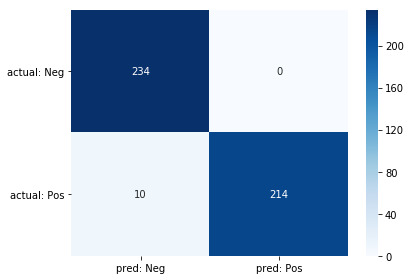

0.9781659388646288


In [15]:
# Quick Model RandomForestClassifier
X,y = train_data, train_labels['Label']
model = ensemble.RandomForestClassifier(class_weight=None, criterion='gini',
                                            max_depth=11, n_estimators=230, n_jobs=-1)
accuracy, predict, actual = find_model_accuracy(X, y, test_data, test_labels['Label'], model)
model.fit(X, y)
print(accuracy)

average accuracy score: 0.9692021857923497


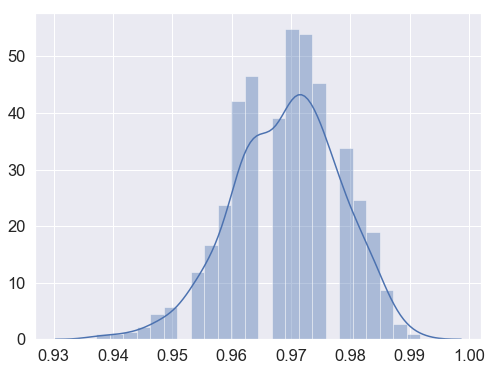

In [16]:
# Model accuracy
# take best estimator from gridsearch and shuffle split x times against train data to get an estimate of performance
clf = grid_search.best_estimator_
cv = model_selection.ShuffleSplit(n_splits=1000, test_size=.2)
cv_scores = model_selection.cross_val_score(clf, X, y, cv=cv)

# plot out the distribution of shufflesplit to get performance estimate
plt.figure(figsize=(8,6))
sns.set(font_scale=1.5)
sns.distributions.distplot(tuple(cv_scores))
print("average accuracy score:", cv_scores.mean())

## Error Analysis

In [21]:
# Create a dataframe showing all the mistakes made by the classifier
fail_analysis = actual.to_frame()
fail_analysis['predicted'] = predict

In [22]:
# Print the mistakes made by the classifier
wrongs = fail_analysis[fail_analysis.Label != fail_analysis.predicted]
wrongs.join(data.drop(columns=['Label']))

,Label,predicted,A102_delta,D102_delta,TP_delta,SCF pct75,SCF Median,SCF Mean,BI_Res_Mean,BI_Res_std
WAFER_ID,,,,,,,,,,
65800208SEA6,1,0,0.00,0.00,5.56,0.0,0.0,0.00000,33.111412,1.211429
65800208SEA6,1,0,0.00,0.00,5.56,0.0,0.0,0.00000,33.111412,1.211429
6A07G118SOC6,1,0,2.78,2.78,8.34,0.0,0.0,0.06250,32.314953,1.281755
6A07G118SOC6,1,0,2.78,2.78,8.34,0.0,0.0,0.06250,32.314953,1.281755
6A07Q282SOE2,0,1,-2.78,-2.78,5.55,0.0,0.0,0.28125,32.122562,1.070435
6A07Q282SOE2,0,1,-2.78,-2.78,5.55,0.0,0.0,0.28125,32.122562,1.070435
6A07Q282SOE2,0,1,-2.78,-2.78,5.55,0.0,0.0,0.28125,32.122562,1.070435
6A07Q282SOE2,0,1,-2.78,-2.78,5.55,0.0,0.0,0.28125,32.122562,1.070435
6A07Q285SOC2,0,1,-5.55,0.00,5.56,0.0,0.0,0.84375,31.831209,0.970349


## Decision Tree Visualization

In [23]:
estimator = model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = data.columns[1:],
                class_names = ['neg','pos'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

## Feature Importance

Usually, using ScikitLearn's feature_importances_ isn't ideal because it inflates the importance of continuous features. However, all our features are continuous, so this doesn't matter. To avoid the bias, use Permutation Feature Importance.

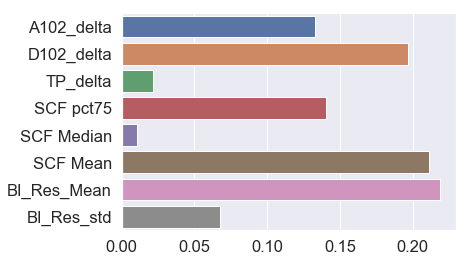

In [24]:
sns.barplot(model.feature_importances_, data.columns[1:])

## Partial Dependency Plot

(-1, 100)

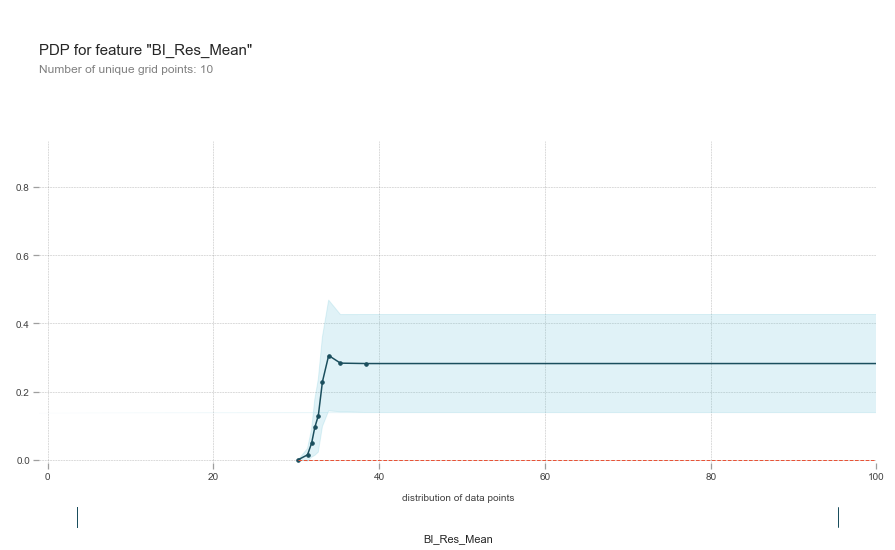

In [33]:
from pdpbox import pdp

feature = "BI_Res_Mean"

pdp_isolate = pdp.pdp_isolate(model=model,
                      dataset=data,
                      model_features=data.columns[1:],
                      feature=feature)
fig, axes = pdp.pdp_plot(pdp_isolate_out=pdp_isolate, feature_name=feature, plot_pts_dist=True)

axes['pdp_ax']['_pdp_ax'].set_xlim(-1,100)

In [27]:
data['BI_Res_Mean'].describe()

count    2.286000e+03
mean     3.849519e+15
std      1.301171e+17
min      3.023525e+01
25%      3.196060e+01
50%      3.288771e+01
75%      3.483400e+01
max      4.400000e+18
Name: BI_Res_Mean, dtype: float64

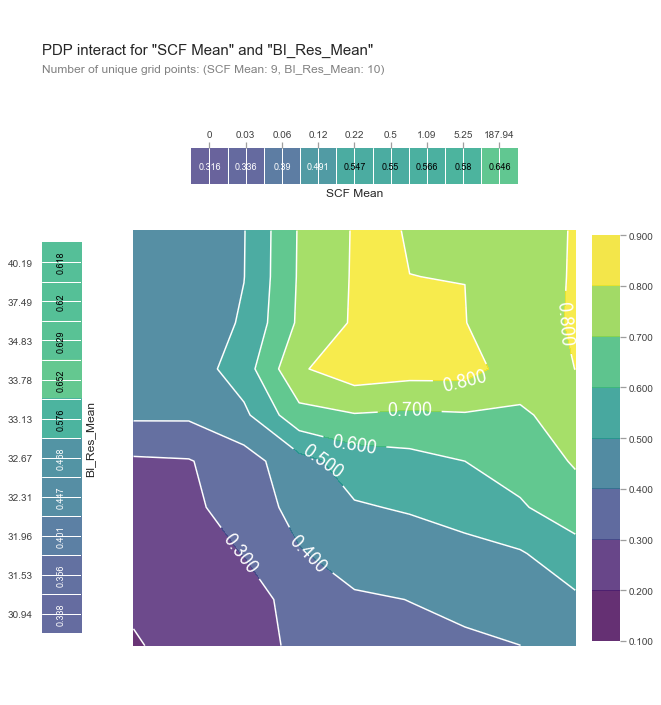

In [28]:
features = ['SCF Mean', 'BI_Res_Mean']


inter1 = pdp.pdp_interact(model=model,
                          dataset=data,
                          model_features=data.columns[1:],
                          features=features,
                          num_grid_points=[10, 10],
                          percentile_ranges=[(5, 95), (5, 95)])
fig, axes = pdp.pdp_interact_plot(pdp_interact_out=inter1,
                                  feature_names=features,
                                  plot_type='contour',
                                  x_quantile=True,
                                  plot_pdp=True)

# Pull Data For Lots We Want To Classify With Our Model

In [17]:
daysback = 300
lotid = "('8IQU37002%%')"

SQLQuery1 = """
select tw.lot_id, substr(tw.lot_id,1,9) as lot_id_base, tw.wafer_id, tw.family_code, 
corner || ' ' || prc.categoryName as parameter, count,
tc.normalized_TestX as chipX, tc.normalized_TestY as chipY,
case 
    when corner = 'M7125P125AA' and prc.categoryName = 'SCF' then count
    else 0
end as SCF_COUNT
from
    DMIW.PattRecChipFactR prcfr
    join DMIW_SYSTEMS.DERIVEDDATASETUP dds  on prcfr.derivedsetupkey = dds.derivedsetupkey
    join DMIW_SYSTEMS.PATTRECCATEGORY prc   on prcfr.pattRecCatKey = prc.pattRecCatKey
    join DMIW_SYSTEMS.TESTEDWAFER tw        on prcfr.testedwaferkey = tw.testedwaferkey
    join DMIW_SYSTEMS.TESTEDCHIP tc         on prcfr.testedwaferkey = tc.testedwaferkey and prcfr.testedchipkey = tc.testedchipkey
    join DMIW_SYSTEMS.GEOGRAPHY g           on prcfr.geographykey = g.geographykey
where
    tw.testedwaferkey is not null and
    categoryName <> '' and exclude_Flag = 'N' and
    corner = 'M7125P125AA' and
    tc.normalized_testx || '_' || tc.normalized_testy not in ('4_48','4_59','144_26','130_15')
    and last_test_date > CURRENT_DATE - {} days
    and lot_Id like {}
order by lot_Id, wafer_Id, tc.normalized_TestX, tc.normalized_TestY, parameter, count
""".format(daysback, lotid)

# Pull the data from ISDW with SQL
df1 = pd.read_sql(SQLQuery1,con)
# new_df will have SCF_Count for 32 chips on the wafer (excluding 4 edge chips)
new_df = df1[['LOT_ID_BASE','WAFER_ID','FAMILY_CODE','CHIPX','CHIPY','SCF_COUNT']].copy()
new_df = new_df.groupby(['LOT_ID_BASE','WAFER_ID','FAMILY_CODE','CHIPX','CHIPY']).max().reset_index()
new_df = new_df[['LOT_ID_BASE','WAFER_ID','FAMILY_CODE','SCF_COUNT']].copy()

# Get Mean of Mean per Lot
mean_wafers = new_df.groupby(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).mean().reset_index().rename(columns={'SCF_COUNT':'SCF Mean'})
mean_lots = mean_wafers.groupby(['LOT_ID_BASE','FAMILY_CODE']).mean().reset_index().rename(columns={'SCF Mean':'Mean(SCF Mean)'})

# Get Mean of Median per Lot
med_wafers = new_df.groupby(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).median().reset_index().rename(columns={'SCF_COUNT':'SCF Median'})
med_lots = med_wafers.groupby(['LOT_ID_BASE','FAMILY_CODE']).mean().reset_index().rename(columns={'SCF Median':'Mean(SCF Median)'})

# Get percentile per Lot
pct75_wafers = new_df.groupby(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).quantile(0.75).reset_index().rename(columns={'SCF_COUNT':'SCF pct75'})
pct75_lots = pct75_wafers.groupby(['LOT_ID_BASE','FAMILY_CODE']).mean().reset_index().rename(columns={'SCF pct75':'Mean(SCF pct75)'})

# Save Wafer Level Data to df
wafers = pct75_wafers.set_index(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']).join([med_wafers.set_index(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID']),mean_wafers.set_index(['LOT_ID_BASE','FAMILY_CODE','WAFER_ID'])]).reset_index()

# Save Lot Level Data to df
lots = pct75_lots.set_index(['LOT_ID_BASE','FAMILY_CODE']).join([med_lots.set_index(['LOT_ID_BASE','FAMILY_CODE']),mean_lots.set_index(['LOT_ID_BASE','FAMILY_CODE'])]).reset_index()

In [18]:
daysback = 300
#lotid = "('8IQU28011%%')"

SQLQuery = """
select lot_Id, wafer_Id, family_Code, date, n,
sum(a102_vmax) as a102_vmax, sum(a102_vmin) as a102_vmin,
sum(d102_vmax) as d102_vmax, sum(d102_vmin) as d102_vmin,
sum(tp_vmax) as tp_vmax, sum(d102_vmin) as tp_vmin
from
(
    select lot_Id, wafer_Id, family_Code, date,
        sample_Size - screened - n_Censored_Low - n_Censored_High as n,
        case when parm_Label = 'DI51_C5_M7125P125A_ST_A102_4M_Perfect' then yield else null end as a102_vmax,
        case when parm_Label = 'DI51_C5_M7060P060A_ST_A102_4M_Perfect' then yield else null end as a102_vmin,
        case when parm_Label = 'DI56_C5_125P125A_ST_D102_2M_Perfect' then yield else null end as d102_vmax,
        case when parm_Label = 'DI56_C5_060P060A_ST_D102_2M_Perfect' then yield else null end as d102_vmin,
        case when parm_Label = 'DI56_C5_125P125A_ST_TP_2M_Perfect' then yield else null end as tp_vmax,
        case when parm_Label = 'DI56_C5_060P060A_ST_TP_2M_Perfect' then yield else null end as tp_vmin
    from DMIW.PTileWaferFact pTileWaferFact, 
        DMIW_SYSTEMS.TestParm testParm, 
        (select testedWaferKey, lot_Id, wafer_Id, family_Code, cur_Lot_Grade as lot_Grade, last_TestTimeStamp as date, level, last_Eqp_Id 
        from DMIW_SYSTEMS.TestedWafer testedWafer 
        where Last_test_date >= (current date - {} days) and Tech_id = '5H 14HP' and Level = 'C5'
        and (Calcdefs = 'DI511' or  Calcdefs = 'DI561')
        ) testedWafer 
    where testedWafer.testedWaferKey = pTileWaferFact.testedWaferKey and 
        testParm.testParmKey = pTileWaferFact.testParmKey 
        and weighted_Mean is not null and abs(weighted_Mean) < 1e25
        and (parm_Label = 'DI51_C5_M7125P125A_ST_A102_4M_Perfect' or parm_Label = 'DI51_C5_M7060P060A_ST_A102_4M_Perfect'
        or parm_Label = 'DI56_C5_125P125A_ST_D102_2M_Perfect' or parm_Label = 'DI56_C5_060P060A_ST_D102_2M_Perfect'
        or parm_Label = 'DI56_C5_125P125A_ST_TP_2M_Perfect' or parm_Label = 'DI56_C5_060P060A_ST_TP_2M_Perfect')
) DGyields
where lot_Id like {}
group by lot_Id, wafer_Id, family_Code, date, n
order by lot_Id, wafer_Id 
""".format(daysback, lotid)
    
# Pull yields and deltas
df = pd.read_sql(SQLQuery,con)
# Create Delta Parameters
df['A102_delta'] = df['A102_VMAX'] - df['A102_VMIN']
df['D102_delta'] = df['D102_VMAX'] - df['D102_VMIN']
df['TP_delta'] = df['TP_VMAX'] - df['TP_VMIN']
# Only use deltas
yields = df[['WAFER_ID','A102_delta','D102_delta','TP_delta']]

In [19]:
daysback = 300
#lotid = "('8IQU28011%%')"

SQLQuery = """
select substr(lot_id,1,9) as lot_id_base, wafer_Id, family_Code, parm_Label as parameter,
    weighted_Mean as mean, case when (min <> max) then standard_Deviation else 0.0 end as stdDev
from 
    DMIW.PTileWaferFact pTileWaferFact
    join DMIW_SYSTEMS.TestParm testParm on testParm.testParmKey = pTileWaferFact.testParmKey
    join
    (select testedWaferKey, lot_Id, wafer_Id, family_Code, cur_Lot_Grade as lot_Grade, last_TestTimeStamp as date, level, last_Eqp_Id 
    from DMIW_SYSTEMS.TestedWafer testedWafer 
    where Last_test_date >= (current date - {} days) and Tech_id = '5H 14HP' 
    ) testedWafer on testedWafer.testedWaferKey = pTileWaferFact.testedWaferKey
where
    weighted_Mean is not null and abs(weighted_Mean) < 1e25 
    and ( ucase(testParm.parm_Label) like 'ED_M1_BI_RES_4PT' )
    and lot_Id like {}
order by lot_Id, wafer_Id
""".format(daysback, lotid)

Res = pd.read_sql(SQLQuery,con)
Res = Res.rename(columns={'MEAN':'BI_Res_Mean', 'STDDEV':'BI_Res_std'}).drop_duplicates()

In [20]:
# Merge Yield Deltas with SCF summary stats
df = yields.set_index(['WAFER_ID']).join(wafers.set_index(['WAFER_ID'])).drop(columns=['LOT_ID_BASE', 'FAMILY_CODE'])

# Merge with BI Resistance Data
df = df.join(Res.set_index(['WAFER_ID'])).drop(columns=['LOT_ID_BASE', 'FAMILY_CODE', 'PARAMETER'])

In [21]:
df.dropna()

,A102_delta,D102_delta,TP_delta,SCF pct75,SCF Median,SCF Mean,BI_Res_Mean,BI_Res_std
WAFER_ID,,,,,,,,
6580041VSEF5,5.56,2.78,16.67,0.00,0,0.28125,32.689564,3.718320
6580041WSEC4,0.00,0.00,5.56,0.00,0,0.12500,42.307652,27.003441
65800432SEB6,5.55,2.77,13.89,0.00,0,0.09375,35.216278,9.196945
65800433SEG0,2.78,0.00,0.00,0.00,0,0.06250,39.180782,19.314180
65800435SEH1,5.55,2.78,22.22,1.00,0,0.43750,40.020943,22.316734
65800434SEC7,5.56,2.78,19.44,0.25,0,0.56250,33.916939,4.940837


In [22]:
# Make predictions
print("LotID:",lotid)
pd.DataFrame(model.predict_proba(df.dropna()), columns=("Prob of Not Donut SCF", "Prob of Donut SCF"), index=df.dropna().index)

LotID: ('8IQU37002%%')


,Prob of Not Donut SCF,Prob of Donut SCF
WAFER_ID,,
6580041VSEF5,0.652068,0.347932
6580041WSEC4,0.951233,0.048767
65800432SEB6,0.727536,0.272464
65800433SEG0,0.933040,0.066960
65800435SEH1,0.100000,0.900000
65800434SEC7,0.152174,0.847826
